In [1]:
import numpy as np 
import pandas as pd

In [2]:
import tensorflow as tf

In [3]:
captions = pd.read_csv('captions.csv')

In [4]:
images = np.load('Images.npy',allow_pickle=True)


In [5]:
import matplotlib.pyplot as plt
%matplotlib inline

In [6]:
import cv2

In [7]:
#resizing images with opencv
new_width = 128
new_height = 128
resized_images = []
for image in images:
    resized_image = cv2.resize(image, (new_width, new_height))
    resized_images.append(resized_image)

numpy_array = np.array(resized_images)



In [8]:
labels = captions['caption']

In [9]:
#preprocessing data_text
import nltk
nltk.download('punkt')
nltk.download('stopwords')
nltk.download('wordnet')
import re
from nltk.corpus import stopwords
from nltk.stem import WordNetLemmatizer
from tensorflow.keras.preprocessing.text import one_hot
from tensorflow.keras.layers import Embedding
from tensorflow.keras.preprocessing.sequence import pad_sequences
from tensorflow.keras.models import Sequential


[nltk_data] Downloading package punkt to
[nltk_data]     C:\Users\Pc\AppData\Roaming\nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\Pc\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package wordnet to
[nltk_data]     C:\Users\Pc\AppData\Roaming\nltk_data...
[nltk_data]   Package wordnet is already up-to-date!


In [10]:
voc_size = 10000

In [11]:
def pre_process_caption(label):
    stemmer = WordNetLemmatizer()
    corpus = []
    for i in range(len(label)):
        review = re.sub('[^a-zA-Z]',' ',label[i])
        review = review.lower()
        review = review.split()
        review = [stemmer.lemmatize(word) for word in review if not word in set(stopwords.words('english'))]
        review = ' '.join(review)
        corpus.append(review)
    onehot_rep = [one_hot(words,voc_size)for words in corpus]
    embedded_docs = pad_sequences(onehot_rep,padding = 'post',maxlen=14)
    return embedded_docs

In [12]:
embedded_docs = pre_process_caption(labels)

In [13]:
def build_generator():
    text_input = tf.keras.layers.Input(shape=(embedded_docs.shape[1],))
    text_embedding = tf.keras.layers.Embedding(voc_size, 100)(text_input)
    y = tf.keras.layers.LSTM(128)(text_embedding)
    latent_input = tf.keras.Input(shape=(100,))
    merge = tf.keras.layers.Concatenate()([y, latent_input])
    x = tf.keras.layers.Dense(8 * 8 * 256, use_bias=False)(merge)
    x = tf.keras.layers.LeakyReLU(alpha=0.2)(x)
    x = tf.keras.layers.Reshape((8, 8, 256))(x)
    x = tf.keras.layers.Conv2DTranspose(128, kernel_size=4, strides=2, padding='same')(x)
    x = tf.keras.layers.BatchNormalization()(x)
    x = tf.keras.layers.LeakyReLU(alpha=0.2)(x)
    x = tf.keras.layers.Conv2DTranspose(64, kernel_size=4, strides=2, padding='same')(x)
    x = tf.keras.layers.BatchNormalization()(x)
    x = tf.keras.layers.LeakyReLU(alpha=0.2)(x)
    x = tf.keras.layers.Conv2DTranspose(32, kernel_size=4, strides=2, padding='same')(x)
    x = tf.keras.layers.LeakyReLU(alpha=0.2)(x)
    x = tf.keras.layers.Conv2DTranspose(3, kernel_size=4, strides=2, padding='same',activation = 'tanh')(x)
    model = tf.keras.Model(inputs=[latent_input, text_input], outputs=x)
    return model


In [14]:
generator = build_generator()
generator.summary()

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 14)]         0           []                               
                                                                                                  
 embedding (Embedding)          (None, 14, 100)      1000000     ['input_1[0][0]']                
                                                                                                  
 lstm (LSTM)                    (None, 128)          117248      ['embedding[0][0]']              
                                                                                                  
 input_2 (InputLayer)           [(None, 100)]        0           []                               
                                                                                              

In [15]:
from tensorflow.keras import layers, Input, Model
def make_discriminator_model():
    image_input = layers.Input(shape=(None,None,3))
    image = layers.Conv2D(64, (3, 3),padding='same' , activation='relu')(image_input)
    image = layers.Dropout(0.25)(image)
    image = layers.Conv2D(128, (3, 3), padding='same', activation='relu')(image)
    image = layers.Dropout(0.25)(image)
    image = layers.GlobalAveragePooling2D()(image)
    image = layers.Dense(256, activation='relu')(image)

    text_input = layers.Input(shape=(embedded_docs.shape[1],))
    text = layers.Dense(256, activation='relu')(text_input)

    combined = layers.Concatenate()([image, text])
    combined = layers.Dense(128, activation='relu')(combined)

    output = layers.Dense(1, activation='sigmoid')(combined)

    discriminator = tf.keras.Model(inputs=[image_input, text_input], outputs=output)
    opt = tf.keras.optimizers.Adam(learning_rate=0.0002, beta_1=0.5)
    discriminator.compile(loss='binary_crossentropy', optimizer=opt, metrics=['accuracy'])
    return discriminator




In [16]:
discriminator = make_discriminator_model()
discriminator.summary()


Model: "model_1"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_3 (InputLayer)           [(None, None, None,  0           []                               
                                 3)]                                                              
                                                                                                  
 conv2d (Conv2D)                (None, None, None,   1792        ['input_3[0][0]']                
                                64)                                                               
                                                                                                  
 dropout (Dropout)              (None, None, None,   0           ['conv2d[0][0]']                 
                                64)                                                         

In [17]:
import tensorflow as tf
from tensorflow.keras import layers, Input, Model

def build_adversarial(generator_model, discriminator_model):
    input_layer1 = layers.Input(shape=(14,))
    input_layer2 = layers.Input(shape=(100,))
    input_layer3 = layers.Input(shape=(14,))

    x = generator_model([input_layer2, input_layer1])
    discriminator_model.trainable = False
    probabilities = discriminator_model([x, input_layer3])
    adversarial_model = Model(inputs=[input_layer1, input_layer2, input_layer3], outputs=[probabilities, x])
    opt = tf.keras.optimizers.Adam(learning_rate = 0.0002, beta_1=0.5)
    adversarial_model.compile(loss='binary_crossentropy', optimizer=opt)
    return adversarial_model


In [18]:
adversarial_model = build_adversarial(generator,discriminator)
adversarial_model.summary()

Model: "model_2"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_6 (InputLayer)           [(None, 100)]        0           []                               
                                                                                                  
 input_5 (InputLayer)           [(None, 14)]         0           []                               
                                                                                                  
 model (Functional)             (None, 128, 128, 3)  5543459     ['input_6[0][0]',                
                                                                  'input_5[0][0]']                
                                                                                                  
 input_7 (InputLayer)           [(None, 14)]         0           []                         

In [19]:
def show_generated_images(generator_model, embedded_docs, epoch):
    num_examples_to_generate = 5 
    noise = np.random.randn(num_examples_to_generate, 100)
    idx = np.random.randint(0, embedded_docs.shape[0], num_examples_to_generate)
    captions = embedded_docs[idx]
    generated_images = generator_model.predict([noise, captions])
    fig, axs = plt.subplots(1, num_examples_to_generate, figsize=(15, 3))
    for i in range(num_examples_to_generate):
        axs[i].imshow(generated_images[i])
        axs[i].axis('off')

    plt.show()
    


2/2 [==============================] - 0s 65ms/step
Epoch 0, Discriminator Loss: 1422.2666015625, Adversarial Loss: 1056.826416015625
1/1 [==============================] - 0s 397ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


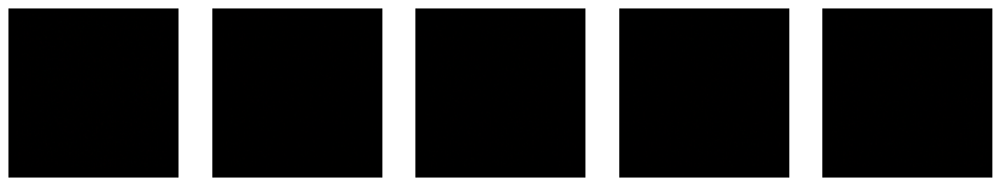

2/2 [==============================] - 0s 65ms/step
Epoch 1, Discriminator Loss: 1143.698486328125, Adversarial Loss: 819.4947509765625
2/2 [==============================] - 0s 62ms/step
Epoch 2, Discriminator Loss: 775.2510375976562, Adversarial Loss: 483.95489501953125
2/2 [==============================] - 0s 70ms/step
Epoch 3, Discriminator Loss: 515.6495034694672, Adversarial Loss: 230.13327026367188
2/2 [==============================] - 0s 71ms/step
Epoch 4, Discriminator Loss: 255.3677978515625, Adversarial Loss: 82.61209869384766
2/2 [==============================] - 0s 62ms/step
Epoch 5, Discriminator Loss: 156.59275817871094, Adversarial Loss: 75.35868072509766
2/2 [==============================] - 0s 62ms/step
Epoch 6, Discriminator Loss: 83.26220703125, Adversarial Loss: 92.16910552978516
2/2 [==============================] - 0s 70ms/step
Epoch 7, Discriminator Loss: 93.12090682983398, Adversarial Loss: 93.54651641845703
2/2 [==============================] - 0s 63ms/s

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


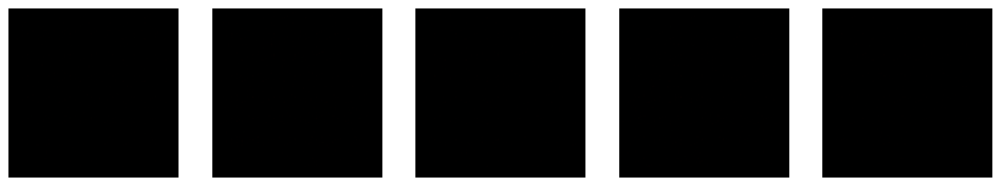

2/2 [==============================] - 0s 64ms/step
Epoch 11, Discriminator Loss: 11.659331321716309, Adversarial Loss: 126.33148956298828
2/2 [==============================] - 0s 63ms/step
Epoch 12, Discriminator Loss: 10.588697910308838, Adversarial Loss: 130.08810424804688
2/2 [==============================] - 0s 63ms/step
Epoch 13, Discriminator Loss: 6.998836994171143, Adversarial Loss: 137.80130004882812
2/2 [==============================] - 0s 67ms/step
Epoch 14, Discriminator Loss: 6.535472869873047, Adversarial Loss: 142.02392578125
2/2 [==============================] - 0s 68ms/step
Epoch 15, Discriminator Loss: 4.786949321627617, Adversarial Loss: 160.06565856933594
2/2 [==============================] - 0s 54ms/step
Epoch 16, Discriminator Loss: 0.01812466513365507, Adversarial Loss: 198.90109252929688
2/2 [==============================] - 0s 67ms/step
Epoch 17, Discriminator Loss: 5.525687515735626, Adversarial Loss: 133.18389892578125
2/2 [============================

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


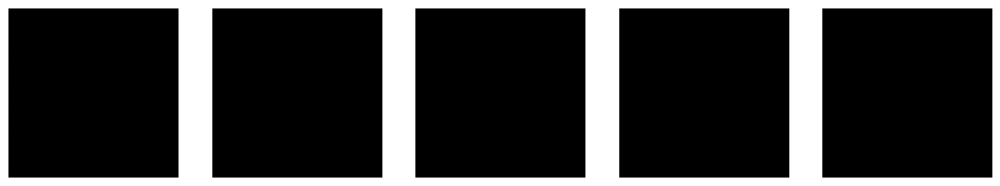

2/2 [==============================] - 0s 58ms/step
Epoch 21, Discriminator Loss: 2.9313147119254013, Adversarial Loss: 151.00790405273438
2/2 [==============================] - 0s 54ms/step
Epoch 22, Discriminator Loss: 1.5643559098243713, Adversarial Loss: 145.6459503173828
2/2 [==============================] - 0s 63ms/step
Epoch 23, Discriminator Loss: 1.1497423648834229, Adversarial Loss: 136.87713623046875
2/2 [==============================] - 0s 68ms/step
Epoch 24, Discriminator Loss: 0.015058016695547849, Adversarial Loss: 164.46531677246094
2/2 [==============================] - 0s 58ms/step
Epoch 25, Discriminator Loss: 0.00011219465523026884, Adversarial Loss: 168.90737915039062
2/2 [==============================] - 0s 62ms/step
Epoch 26, Discriminator Loss: 4.177724838256836, Adversarial Loss: 181.0457763671875
2/2 [==============================] - 0s 52ms/step
Epoch 27, Discriminator Loss: 1.1672839185605178e-20, Adversarial Loss: 182.0477294921875
2/2 [================

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


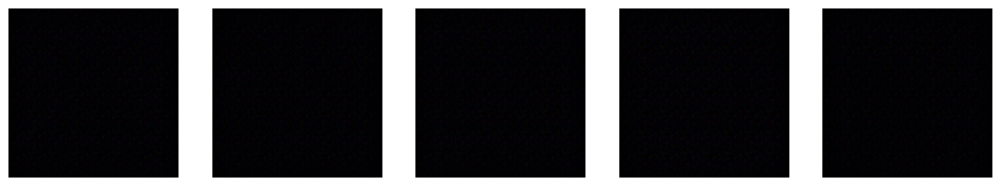

2/2 [==============================] - 0s 55ms/step
Epoch 31, Discriminator Loss: 4.970664436054538e-10, Adversarial Loss: 170.3074493408203
2/2 [==============================] - 0s 62ms/step
Epoch 32, Discriminator Loss: 0.4294174313545227, Adversarial Loss: 170.42843627929688
2/2 [==============================] - 0s 63ms/step
Epoch 33, Discriminator Loss: 1.9062115774737265e-10, Adversarial Loss: 179.98670959472656
2/2 [==============================] - 0s 54ms/step
Epoch 34, Discriminator Loss: 1.2231993692312613e-17, Adversarial Loss: 185.06874084472656
2/2 [==============================] - 0s 65ms/step
Epoch 35, Discriminator Loss: 1.8336033898316031e-25, Adversarial Loss: 189.9322052001953
2/2 [==============================] - 0s 62ms/step
Epoch 36, Discriminator Loss: 4.872935945180086e-28, Adversarial Loss: 182.2879180908203
2/2 [==============================] - 0s 68ms/step
Epoch 37, Discriminator Loss: 7.540358387568758e-24, Adversarial Loss: 203.89199829101562
2/2 [====

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


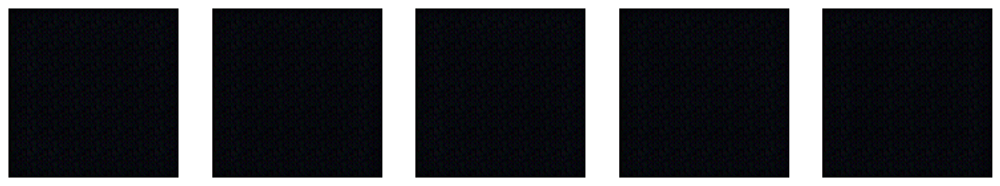

2/2 [==============================] - 0s 68ms/step
Epoch 41, Discriminator Loss: 9.355533960044673e-15, Adversarial Loss: 205.9568328857422
2/2 [==============================] - 0s 61ms/step
Epoch 42, Discriminator Loss: 5.758936794109104e-07, Adversarial Loss: 197.05892944335938
2/2 [==============================] - 0s 65ms/step
Epoch 43, Discriminator Loss: 8.646115701191703e-14, Adversarial Loss: 195.73583984375
2/2 [==============================] - 0s 63ms/step
Epoch 44, Discriminator Loss: 0.18679632246494293, Adversarial Loss: 182.53953552246094
2/2 [==============================] - 0s 63ms/step
Epoch 45, Discriminator Loss: 6.127080127574795e-23, Adversarial Loss: 184.934326171875
2/2 [==============================] - 0s 62ms/step
Epoch 46, Discriminator Loss: 4.124513267345643e-19, Adversarial Loss: 191.14585876464844
2/2 [==============================] - 0s 64ms/step
Epoch 47, Discriminator Loss: 2.062881929078969e-13, Adversarial Loss: 182.3814239501953
2/2 [==========

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


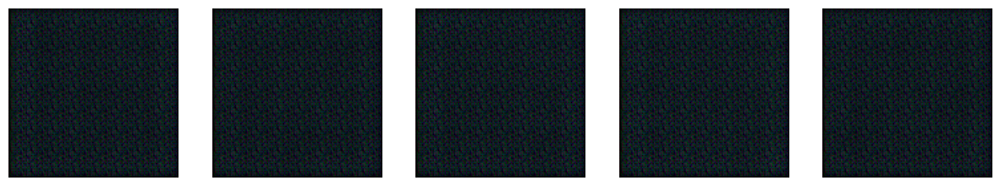

2/2 [==============================] - 0s 55ms/step
Epoch 51, Discriminator Loss: 3.8911535673251954e-20, Adversarial Loss: 180.82997131347656
2/2 [==============================] - 0s 63ms/step
Epoch 52, Discriminator Loss: 1.5685302505611683e-19, Adversarial Loss: 194.5751953125
2/2 [==============================] - 0s 63ms/step
Epoch 53, Discriminator Loss: 6.823780429598969e-10, Adversarial Loss: 184.901611328125
2/2 [==============================] - 0s 58ms/step
Epoch 54, Discriminator Loss: 2.1388128632857193e-19, Adversarial Loss: 182.86741638183594
2/2 [==============================] - 0s 66ms/step
Epoch 55, Discriminator Loss: 4.937584785480453e-10, Adversarial Loss: 173.5080108642578
2/2 [==============================] - 0s 75ms/step
Epoch 56, Discriminator Loss: 1.7886409436099975e-19, Adversarial Loss: 194.90087890625
2/2 [==============================] - 0s 68ms/step
Epoch 57, Discriminator Loss: 3.047615545342941e-12, Adversarial Loss: 186.48606872558594
2/2 [=======

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


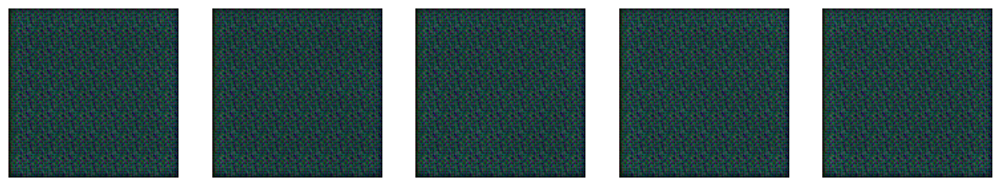

2/2 [==============================] - 0s 63ms/step
Epoch 61, Discriminator Loss: 8.56879874672721e-15, Adversarial Loss: 191.8799591064453
2/2 [==============================] - 0s 65ms/step
Epoch 62, Discriminator Loss: 1.8809276358666693e-10, Adversarial Loss: 196.7173614501953
2/2 [==============================] - 0s 66ms/step
Epoch 63, Discriminator Loss: 8.333840429689573e-14, Adversarial Loss: 186.64187622070312
2/2 [==============================] - 0s 70ms/step
Epoch 64, Discriminator Loss: 1.3477431247844313e-13, Adversarial Loss: 186.4082794189453
2/2 [==============================] - 0s 64ms/step
Epoch 65, Discriminator Loss: 7.977492640833739e-11, Adversarial Loss: 188.07835388183594
2/2 [==============================] - 0s 67ms/step
Epoch 66, Discriminator Loss: 1.395615368143787e-13, Adversarial Loss: 195.71530151367188
2/2 [==============================] - 0s 71ms/step
Epoch 67, Discriminator Loss: 1.0133011211414886e-07, Adversarial Loss: 200.41146850585938
2/2 [==

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


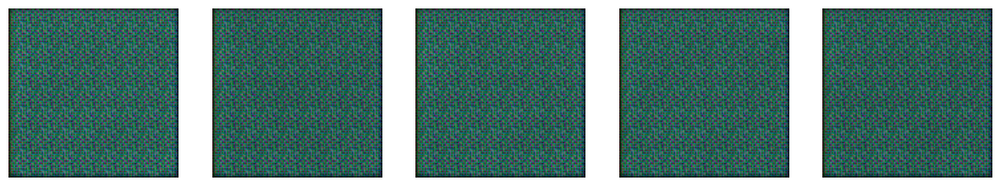

2/2 [==============================] - 0s 64ms/step
Epoch 71, Discriminator Loss: 1.2125259513334351e-24, Adversarial Loss: 194.05752563476562
2/2 [==============================] - 0s 72ms/step
Epoch 72, Discriminator Loss: 6.79647988279311e-14, Adversarial Loss: 185.08438110351562
2/2 [==============================] - 0s 51ms/step
Epoch 73, Discriminator Loss: 3.12967865870057e-14, Adversarial Loss: 179.47036743164062
2/2 [==============================] - 0s 66ms/step
Epoch 74, Discriminator Loss: 3.60576911211108e-14, Adversarial Loss: 209.53538513183594
2/2 [==============================] - 0s 58ms/step
Epoch 75, Discriminator Loss: 8.690007806226585e-14, Adversarial Loss: 177.61715698242188
2/2 [==============================] - 0s 68ms/step
Epoch 76, Discriminator Loss: 1.6303091147050475e-13, Adversarial Loss: 207.4918975830078
2/2 [==============================] - 0s 63ms/step
Epoch 77, Discriminator Loss: 3.059668897980115e-13, Adversarial Loss: 185.2007293701172
2/2 [====

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


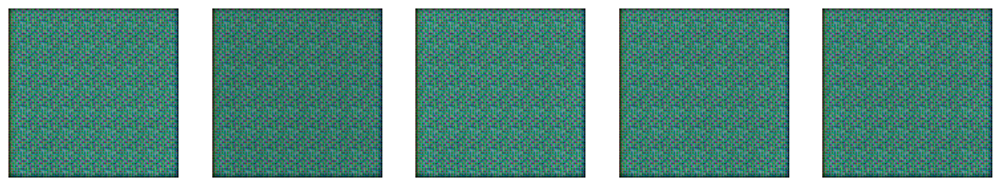

2/2 [==============================] - 0s 67ms/step
Epoch 81, Discriminator Loss: 9.73234107077998e-24, Adversarial Loss: 198.1284637451172
2/2 [==============================] - 0s 64ms/step
Epoch 82, Discriminator Loss: 1.8976294602519872e-13, Adversarial Loss: 180.4754638671875
2/2 [==============================] - 0s 70ms/step
Epoch 83, Discriminator Loss: 1.4890796928845873e-11, Adversarial Loss: 193.02804565429688
2/2 [==============================] - 0s 58ms/step
Epoch 84, Discriminator Loss: 6.483025599782763e-14, Adversarial Loss: 190.6359405517578
2/2 [==============================] - 0s 70ms/step
Epoch 85, Discriminator Loss: 1.1361671325982314e-10, Adversarial Loss: 184.77142333984375
2/2 [==============================] - 0s 55ms/step
Epoch 86, Discriminator Loss: 1.5062776059001498e-13, Adversarial Loss: 187.1826171875
2/2 [==============================] - 0s 66ms/step
Epoch 87, Discriminator Loss: 3.0253901622272865e-18, Adversarial Loss: 198.0814208984375
2/2 [=====

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


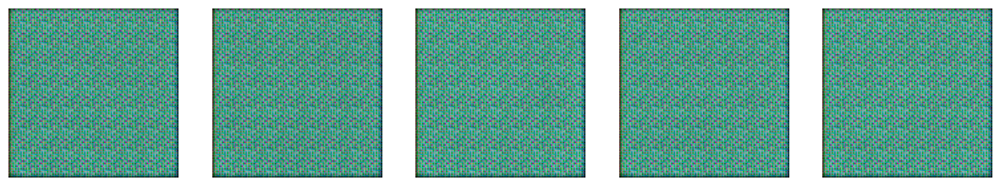

2/2 [==============================] - 0s 63ms/step
Epoch 91, Discriminator Loss: 1.2533886428744978e-10, Adversarial Loss: 172.15557861328125
2/2 [==============================] - 0s 63ms/step
Epoch 92, Discriminator Loss: 1.5248849649651675e-07, Adversarial Loss: 212.1968231201172
2/2 [==============================] - 0s 67ms/step
Epoch 93, Discriminator Loss: 1.973230833125193e-24, Adversarial Loss: 196.61187744140625
2/2 [==============================] - 0s 54ms/step
Epoch 94, Discriminator Loss: 6.03647652155058e-14, Adversarial Loss: 183.7085723876953
2/2 [==============================] - 0s 61ms/step
Epoch 95, Discriminator Loss: 9.94467819690739e-16, Adversarial Loss: 190.58795166015625
2/2 [==============================] - 0s 54ms/step
Epoch 96, Discriminator Loss: 2.497025210299736e-13, Adversarial Loss: 182.1212615966797
2/2 [==============================] - 0s 63ms/step
Epoch 97, Discriminator Loss: 2.976351693117377e-23, Adversarial Loss: 192.38548278808594
2/2 [====

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


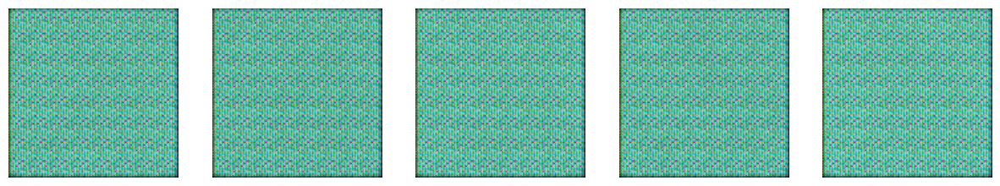

2/2 [==============================] - 0s 62ms/step
Epoch 101, Discriminator Loss: 4.848468631787894e-13, Adversarial Loss: 199.24264526367188
2/2 [==============================] - 0s 68ms/step
Epoch 102, Discriminator Loss: 2.7438138565833475e-13, Adversarial Loss: 186.267578125
2/2 [==============================] - 0s 69ms/step
Epoch 103, Discriminator Loss: 1.014513611793518, Adversarial Loss: 185.0677032470703
2/2 [==============================] - 0s 63ms/step
Epoch 104, Discriminator Loss: 1.0956142659779289e-09, Adversarial Loss: 170.5961151123047
2/2 [==============================] - 0s 74ms/step
Epoch 105, Discriminator Loss: 2.9912081700445015e-09, Adversarial Loss: 167.32557678222656
2/2 [==============================] - 0s 61ms/step
Epoch 106, Discriminator Loss: 4.010958665895403e-12, Adversarial Loss: 178.36854553222656
2/2 [==============================] - 0s 62ms/step
Epoch 107, Discriminator Loss: 3.632032279201117e-16, Adversarial Loss: 171.32144165039062
2/2 [==

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


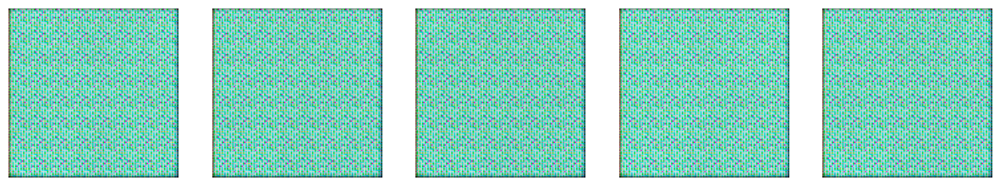

2/2 [==============================] - 0s 73ms/step
Epoch 111, Discriminator Loss: 0.0001006614402285777, Adversarial Loss: 161.3318328857422
2/2 [==============================] - 0s 65ms/step
Epoch 112, Discriminator Loss: 0.1518830955028534, Adversarial Loss: 180.3414764404297
2/2 [==============================] - 0s 54ms/step
Epoch 113, Discriminator Loss: 5.8963701102096074e-27, Adversarial Loss: 197.55348205566406
2/2 [==============================] - 0s 76ms/step
Epoch 114, Discriminator Loss: 5.353341769875897e-09, Adversarial Loss: 184.38699340820312
2/2 [==============================] - 0s 64ms/step
Epoch 115, Discriminator Loss: 2.431127188710474e-22, Adversarial Loss: 179.12477111816406
2/2 [==============================] - 0s 70ms/step
Epoch 116, Discriminator Loss: 6.56757870309832e-10, Adversarial Loss: 171.71290588378906
2/2 [==============================] - 0s 59ms/step
Epoch 117, Discriminator Loss: 2.4835853873623953e-18, Adversarial Loss: 188.07461547851562
2/2

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


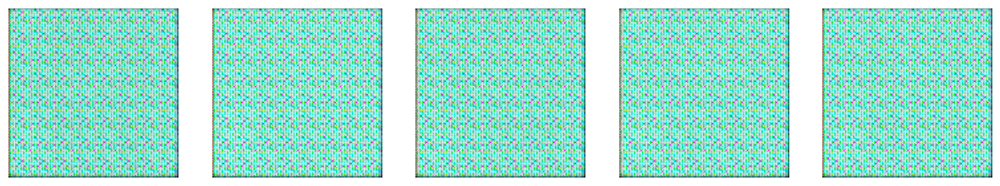

2/2 [==============================] - 0s 67ms/step
Epoch 121, Discriminator Loss: 3.149365071228004e-19, Adversarial Loss: 171.85536193847656
2/2 [==============================] - 0s 71ms/step
Epoch 122, Discriminator Loss: 4.28103368794769e-16, Adversarial Loss: 176.0205535888672
2/2 [==============================] - 0s 69ms/step
Epoch 123, Discriminator Loss: 2.1049780943641332e-15, Adversarial Loss: 173.99436950683594
2/2 [==============================] - 0s 70ms/step
Epoch 124, Discriminator Loss: 4.449019909025123e-16, Adversarial Loss: 190.8341064453125
2/2 [==============================] - 0s 68ms/step
Epoch 125, Discriminator Loss: 1.3955063363923028e-20, Adversarial Loss: 195.7895050048828
2/2 [==============================] - 0s 71ms/step
Epoch 126, Discriminator Loss: 4.218236860629044e-27, Adversarial Loss: 200.6604766845703
2/2 [==============================] - 0s 59ms/step
Epoch 127, Discriminator Loss: 1.7601604852465758e-13, Adversarial Loss: 182.51852416992188
2

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


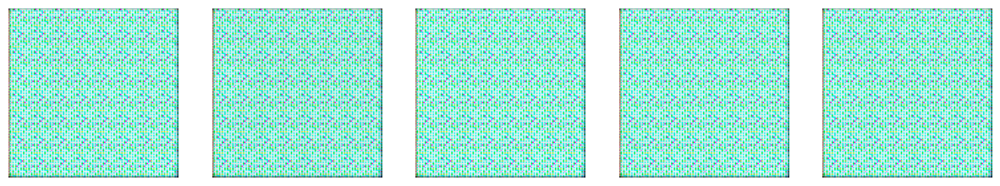

2/2 [==============================] - 0s 65ms/step
Epoch 131, Discriminator Loss: 6.216730024341565e-16, Adversarial Loss: 172.75953674316406
2/2 [==============================] - 0s 62ms/step
Epoch 132, Discriminator Loss: 2.2152606138359232e-10, Adversarial Loss: 160.45327758789062
2/2 [==============================] - 0s 63ms/step
Epoch 133, Discriminator Loss: 8.885166204293315e-21, Adversarial Loss: 184.59840393066406
2/2 [==============================] - 0s 67ms/step
Epoch 134, Discriminator Loss: 1.8862922291848494e-13, Adversarial Loss: 189.5103759765625
2/2 [==============================] - 0s 62ms/step
Epoch 135, Discriminator Loss: 6.227089102139871e-07, Adversarial Loss: 169.12937927246094
2/2 [==============================] - 0s 57ms/step
Epoch 136, Discriminator Loss: 3.163552248173104e-26, Adversarial Loss: 189.64395141601562
2/2 [==============================] - 0s 60ms/step
Epoch 137, Discriminator Loss: 5.165286321695529e-16, Adversarial Loss: 186.7014923095703

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


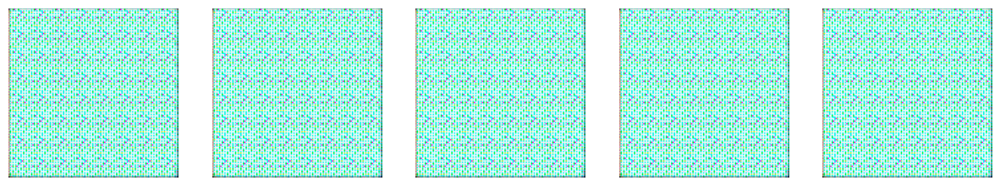

2/2 [==============================] - 0s 68ms/step
Epoch 141, Discriminator Loss: 5.2891208340790965e-23, Adversarial Loss: 187.8856658935547
2/2 [==============================] - 0s 63ms/step
Epoch 142, Discriminator Loss: 2.1552696422271617e-13, Adversarial Loss: 178.31190490722656
2/2 [==============================] - 0s 62ms/step
Epoch 143, Discriminator Loss: 1.5052301771138374e-25, Adversarial Loss: 190.54153442382812
2/2 [==============================] - 0s 54ms/step
Epoch 144, Discriminator Loss: 5.418762087843006e-16, Adversarial Loss: 206.1931610107422
2/2 [==============================] - 0s 58ms/step
Epoch 145, Discriminator Loss: 1.5585072710256145e-16, Adversarial Loss: 173.52468872070312
2/2 [==============================] - 0s 52ms/step
Epoch 146, Discriminator Loss: 1.876752526963523e-29, Adversarial Loss: 194.88104248046875
2/2 [==============================] - 0s 72ms/step
Epoch 147, Discriminator Loss: 1.9365487211996923e-19, Adversarial Loss: 180.59925842285

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


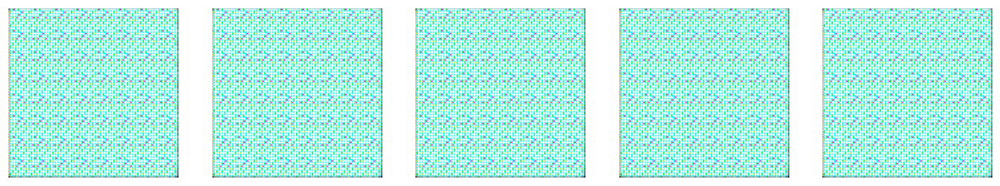

2/2 [==============================] - 0s 63ms/step
Epoch 151, Discriminator Loss: 3.390981839817753e-18, Adversarial Loss: 184.94046020507812
2/2 [==============================] - 0s 66ms/step
Epoch 152, Discriminator Loss: 3.6750914637725853e-16, Adversarial Loss: 185.77040100097656
2/2 [==============================] - 0s 66ms/step
Epoch 153, Discriminator Loss: 3.24357172522792e-14, Adversarial Loss: 172.04385375976562
2/2 [==============================] - 0s 58ms/step
Epoch 154, Discriminator Loss: 2.1355303864243474e-13, Adversarial Loss: 170.00555419921875
2/2 [==============================] - 0s 67ms/step
Epoch 155, Discriminator Loss: 3.008384336732376e-18, Adversarial Loss: 199.03927612304688
2/2 [==============================] - 0s 53ms/step
Epoch 156, Discriminator Loss: 3.687859809781593e-16, Adversarial Loss: 192.46664428710938
2/2 [==============================] - 0s 61ms/step
Epoch 157, Discriminator Loss: 5.173131716215288e-19, Adversarial Loss: 194.7074737548828

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


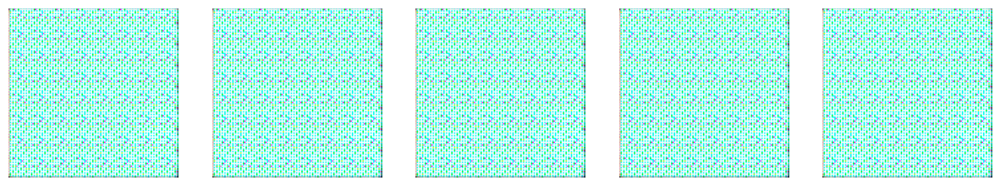

2/2 [==============================] - 0s 65ms/step
Epoch 161, Discriminator Loss: 2.218790040586782e-09, Adversarial Loss: 182.525634765625
2/2 [==============================] - 0s 59ms/step
Epoch 162, Discriminator Loss: 5.23072297281546e-12, Adversarial Loss: 183.16915893554688
2/2 [==============================] - 0s 80ms/step
Epoch 163, Discriminator Loss: 5.801815170293782e-16, Adversarial Loss: 175.33042907714844
2/2 [==============================] - 0s 58ms/step
Epoch 164, Discriminator Loss: 4.3206002756705294e-19, Adversarial Loss: 193.0946502685547
2/2 [==============================] - 0s 66ms/step
Epoch 165, Discriminator Loss: 8.561020003939669e-19, Adversarial Loss: 179.37921142578125
2/2 [==============================] - 0s 70ms/step
Epoch 166, Discriminator Loss: 8.740765001022443e-23, Adversarial Loss: 186.24342346191406
2/2 [==============================] - 0s 61ms/step
Epoch 167, Discriminator Loss: 3.808585179748843e-16, Adversarial Loss: 188.6755828857422
2/2

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


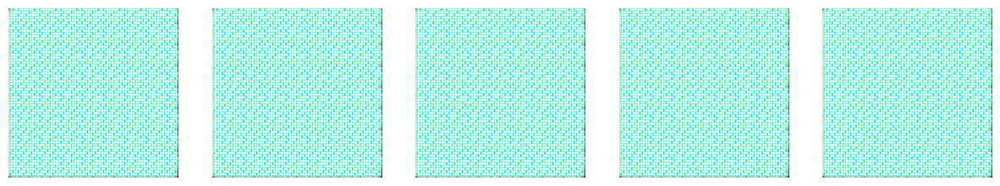

2/2 [==============================] - 0s 70ms/step
Epoch 171, Discriminator Loss: 2.2051856326220365e-13, Adversarial Loss: 189.35362243652344
2/2 [==============================] - 0s 60ms/step
Epoch 172, Discriminator Loss: 8.435060574321403e-23, Adversarial Loss: 176.3744659423828
2/2 [==============================] - 0s 75ms/step
Epoch 173, Discriminator Loss: 2.1403261191305512e-20, Adversarial Loss: 186.48687744140625
2/2 [==============================] - 0s 68ms/step
Epoch 174, Discriminator Loss: 5.457585170199437e-19, Adversarial Loss: 192.21575927734375
2/2 [==============================] - 0s 65ms/step
Epoch 175, Discriminator Loss: 4.35835054104443e-19, Adversarial Loss: 181.239013671875
2/2 [==============================] - 0s 55ms/step
Epoch 176, Discriminator Loss: 2.716340607306078e-12, Adversarial Loss: 176.27525329589844
2/2 [==============================] - 0s 66ms/step
Epoch 177, Discriminator Loss: 2.657349243334107e-15, Adversarial Loss: 179.68499755859375
2

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


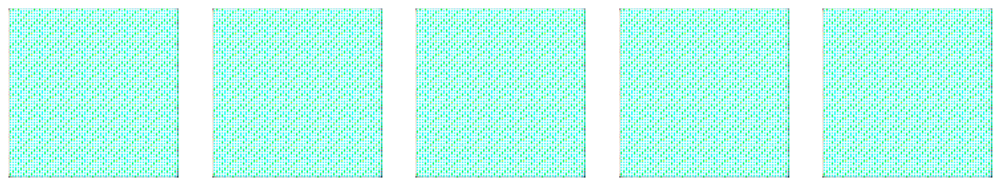

2/2 [==============================] - 0s 77ms/step
Epoch 181, Discriminator Loss: 6.979528621720021e-10, Adversarial Loss: 198.29971313476562
2/2 [==============================] - 0s 72ms/step
Epoch 182, Discriminator Loss: 7.951123787260361e-11, Adversarial Loss: 176.2021026611328
2/2 [==============================] - 0s 64ms/step
Epoch 183, Discriminator Loss: 4.82619584180256e-18, Adversarial Loss: 188.35305786132812
2/2 [==============================] - 0s 67ms/step
Epoch 184, Discriminator Loss: 2.1477775301094908e-20, Adversarial Loss: 202.31874084472656
2/2 [==============================] - 0s 56ms/step
Epoch 185, Discriminator Loss: 7.5299017021635e-11, Adversarial Loss: 185.5361328125
2/2 [==============================] - 0s 60ms/step
Epoch 186, Discriminator Loss: 1.9180678519540325e-18, Adversarial Loss: 192.0249786376953
2/2 [==============================] - 0s 77ms/step
Epoch 187, Discriminator Loss: 1.470370821070426e-18, Adversarial Loss: 180.13320922851562
2/2 [=

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


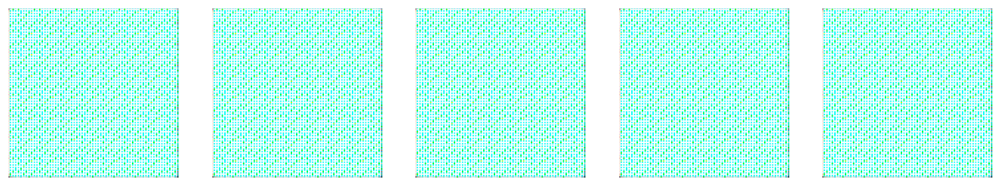

2/2 [==============================] - 0s 65ms/step
Epoch 191, Discriminator Loss: 2.2699580388106655e-13, Adversarial Loss: 168.29135131835938
2/2 [==============================] - 0s 69ms/step
Epoch 192, Discriminator Loss: 2.756285217425658e-12, Adversarial Loss: 173.84889221191406
2/2 [==============================] - 0s 66ms/step
Epoch 193, Discriminator Loss: 7.355695913480176e-11, Adversarial Loss: 176.9871368408203
2/2 [==============================] - 0s 63ms/step
Epoch 194, Discriminator Loss: 6.240991165533296e-16, Adversarial Loss: 189.9634552001953
2/2 [==============================] - 0s 67ms/step
Epoch 195, Discriminator Loss: 5.6729462955685635e-19, Adversarial Loss: 190.8004150390625
2/2 [==============================] - 0s 69ms/step
Epoch 196, Discriminator Loss: 5.558493967100547e-19, Adversarial Loss: 183.07064819335938
2/2 [==============================] - 0s 54ms/step
Epoch 197, Discriminator Loss: 2.300888158387332e-13, Adversarial Loss: 171.88296508789062


In [20]:
def train_gan(generator_model, discriminator_model, adversarial_model, embedded_docs, numpy_array, epochs=200, batch_size=64):

    for epoch in range(epochs):
        idx = np.random.randint(0, embedded_docs.shape[0], batch_size)
        real_text = embedded_docs[idx]
        real_images = numpy_array[idx]
        noise = np.random.randn(batch_size, 100)
        fake_images = generator_model.predict([noise, real_text])
        real_labels = np.ones((batch_size, 1))
        fake_labels = np.zeros((batch_size, 1))
        d_loss_real = discriminator_model.train_on_batch([real_images, real_text], real_labels)
        d_loss_fake = discriminator_model.train_on_batch([fake_images, real_text], fake_labels)
        d_loss =  np.add(d_loss_real, d_loss_fake)
        noise = np.random.randn(batch_size, 100)
        valid_labels = np.ones((batch_size, 1))
        generated_images = generator_model.predict([noise, real_text])
        g_loss = adversarial_model.train_on_batch([real_text, noise, real_text], [valid_labels, generated_images])
        print(f"Epoch {epoch}, Discriminator Loss: {d_loss[0]}, Adversarial Loss: {g_loss[0]}")
        if epoch % 10 == 0:
            show_generated_images(generator_model, embedded_docs, epoch)
    generator_model.save('generator_model.h5')   

train_gan(generator, discriminator, adversarial_model, embedded_docs, numpy_array, epochs=200, batch_size=64)


In [21]:
generator_model = tf.keras.models.load_model('generator_model.h5')

In [22]:
batch_size = 6
y = np.random.randint(0, embedded_docs.shape[0], batch_size)
real_text = embedded_docs[y]
real_images = images[y]
noise = np.random.randn(batch_size, 100)
fake_images = generator_model.predict([noise, real_text])

1/1 [==============================] - 0s 315ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


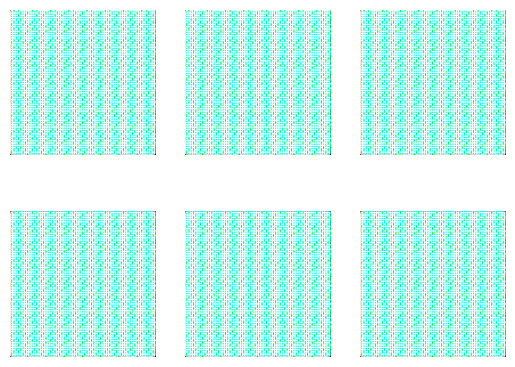

In [23]:
for i in range(batch_size):
    plt.subplot(2,3,i+1)
    plt.imshow(fake_images[i])
    plt.axis(False)

In [24]:
text = ['drawing of red pokemon','a cartoon character with red nose']
real_text = pd.Series(data = text)
image_of_text =  pre_process_caption(real_text)
noise_ = np.random.randn(len(text), 100)
fake_images = generator_model.predict([noise_, image_of_text])

1/1 [==============================] - 0s 21ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


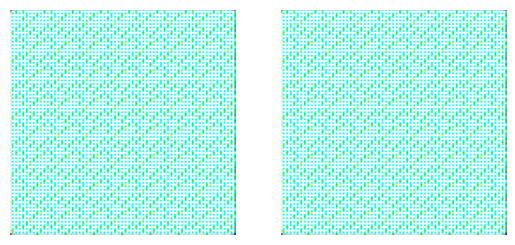

In [25]:
for i in range(len(text)):
    plt.subplot(1,2,i+1)
    plt.imshow(fake_images[i])
    plt.axis(False)